In [1]:
import os
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, transform
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

import warnings
warnings.filterwarnings("ignore")


plt.ion()   # interactive mode

In [2]:
genera_class = pd.read_csv('./wikiart/genre_class.txt', delimiter=' ', header=None)

artist_class = pd.read_csv('./wikiart/artist_class.txt', delimiter=' ', header=None)

style_class = pd.read_csv('./wikiart/style_class.txt', delimiter=' ', header=None)

In [3]:
style_class

,0,1
0,0,Abstract_Expressionism
1,1,Action_painting
2,2,Analytical_Cubism
3,3,Art_Nouveau
4,4,Baroque
5,5,Color_Field_Painting
6,6,Contemporary_Realism
7,7,Cubism
8,8,Early_Renaissance
9,9,Expressionism


In [4]:
genera_dict = genera_class[1].to_dict()
artist_dict = artist_class[1].to_dict()
style_dict = style_class[1].to_dict()

In [5]:
[genera_dict[key] for key in [0, 1, 2]]

['abstract_painting', 'cityscape', 'genre_painting']

In [6]:
columns = ['Image_Path', 'Label']
genre_train = pd.read_csv('./wikiart/genre_train.csv', header=None, names=columns)
genre_train.Image_Path

0        Northern_Renaissance/hieronymus-bosch_st-jacqu...
1        Post_Impressionism/vincent-van-gogh_ears-of-wh...
2        Symbolism/theodor-severin-kittelsen_kvitebj-rn...
3        Expressionism/martiros-saryan_mother-of-the-ar...
4        Early_Renaissance/leonardo-da-vinci_study-for-...
                               ...                        
45498    Post_Impressionism/pablo-picasso_marin-and-stu...
45499    Expressionism/ernst-ludwig-kirchner_windswept-...
45500    Color_Field_Painting/gene-davis_two-part-blue-...
45501    Abstract_Expressionism/frank-bowling_sacha-jas...
45502    Ukiyo_e/utagawa-kuniyoshi_the-station-kambara.jpg
Name: Image_Path, Length: 45503, dtype: object

In [7]:
samples = genre_train.sample(n = 25)
print(samples.shape)
genre_train.loc[genre_train['Label'].isin([2,4])]
# genre_train

(25, 2)


,Image_Path,Label
1,Post_Impressionism/vincent-van-gogh_ears-of-wh...,4
7,New_Realism/john-french-sloan_helen-taylor-ske...,2
9,Naive_Art_Primitivism/marc-chagall_clown-with-...,2
10,Expressionism/nikolaos-lytras_landscape-of-sou...,4
15,Post_Impressionism/grace-cossington-smith_tree...,4
...,...,...
45488,Romanticism/ivan-aivazovsky_surf-1897.jpg,4
45490,Impressionism/alfred-sisley_banks-of-the-loing...,4
45495,Impressionism/claude-monet_poppy-field-in-give...,4
45499,Expressionism/ernst-ludwig-kirchner_windswept-...,4


# Prepare WikiArt Dataset

In [8]:
class WikiArtDataset(Dataset):

    def __init__(self, root_dir, category, transform=None, size=None, label_filters = None):
        if category == 'artist' or category == 'genre' or category == 'style':
            self.category = category
        else:
            raise ValueError('category must be either "artist" or "genre" or "style"')

        self.category = category
        self.root_dir = root_dir
        self.transform = transform
        
        class_file = os.path.join(root_dir, f'{category}_class.txt')
        labels = pd.read_csv(class_file, delimiter=' ', header=None)
        self.label_dict = labels[1]
        print(f'Category labels\': \n{self.label_dict}')

        category_train = os.path.join(root_dir, f'{category}_train.csv')
        print(f'Load images from : {category_train}')
        columns = ['Image_Path', 'Label']
        self.train_list = pd.read_csv(category_train, header=None, names=columns)
        if size is not None:
            self.train_list = self.train_list[:size]
            
        if label_filters is not None:
            selected_labels = [self.label_dict[key] for key in label_filters]
            print(f'WikiArt Label filters: {selected_labels}')
            self.train_list = self.train_list.loc[self.train_list['Label'].isin(label_filters)]
            self.train_list = self.train_list.reset_index(drop=True)

        print(f'Dataset size: {len(self.train_list)}')

    

    def __len__(self):
        return len(self.train_list)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,
                                self.train_list.Image_Path[idx])
        image = io.imread(img_name)

        if self.transform:
            image = self.transform(image)

        label = self.train_list.Label[idx]
        return (image, self.label_dict[label])


Category labels': 
0     abstract_painting
1             cityscape
2        genre_painting
3          illustration
4             landscape
5         nude_painting
6              portrait
7    religious_painting
8      sketch_and_study
9            still_life
Name: 1, dtype: object
Load images from : ./wikiart/genre_train.csv
WikiArt Label filters: ['abstract_painting', 'landscape', 'portrait', 'still_life']
Dataset size: 24661
0 (500, 353, 3) landscape
1 (800, 648, 3) portrait
2 (800, 631, 3) portrait
3 (500, 440, 3) abstract_painting
4 (204, 320, 3) landscape
5 (570, 450, 3) abstract_painting
6 (2412, 1900, 3) portrait
7 (1966, 2503, 3) portrait


<Figure size 640x480 with 0 Axes>

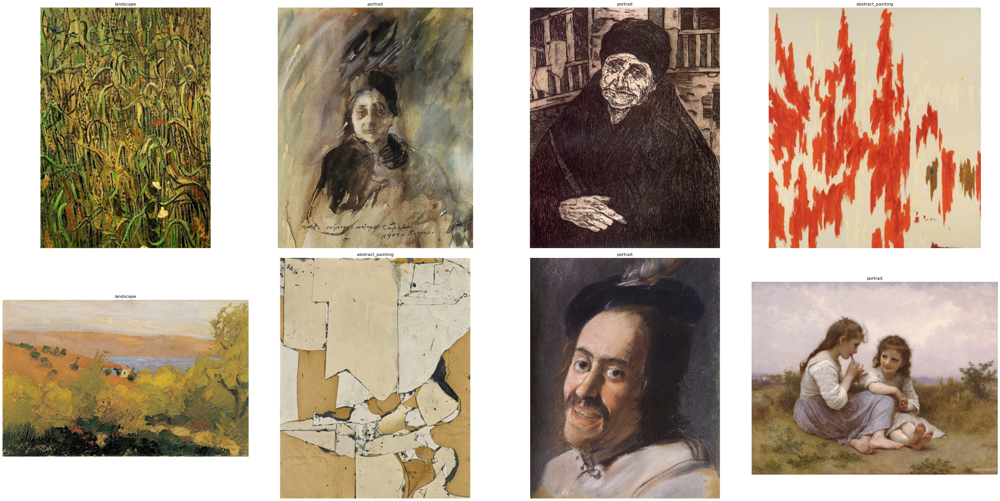

In [9]:
genra_dataset = WikiArtDataset(root_dir='./wikiart/', category='genre', label_filters=[0,4,6,9])

fig = plt.figure()

plt.figure(figsize=(40, 40))
for i, sample in enumerate(genra_dataset):
    image = sample[0]
    label = sample[1]
    print(i, image.shape, label)

    ax = plt.subplot(4, 4, i + 1)
    plt.tight_layout()
    ax.set_title(label)
    ax.axis('off')

    plt.imshow(image)

    if i == 7:
        plt.show()
        break

0 torch.Size([3, 128, 128]) landscape
1 torch.Size([3, 128, 128]) portrait
2 torch.Size([3, 128, 128]) portrait
3 torch.Size([3, 128, 128]) abstract_painting
4 torch.Size([3, 128, 128]) landscape
5 torch.Size([3, 128, 128]) abstract_painting
6 torch.Size([3, 128, 128]) portrait
7 torch.Size([3, 128, 128]) portrait


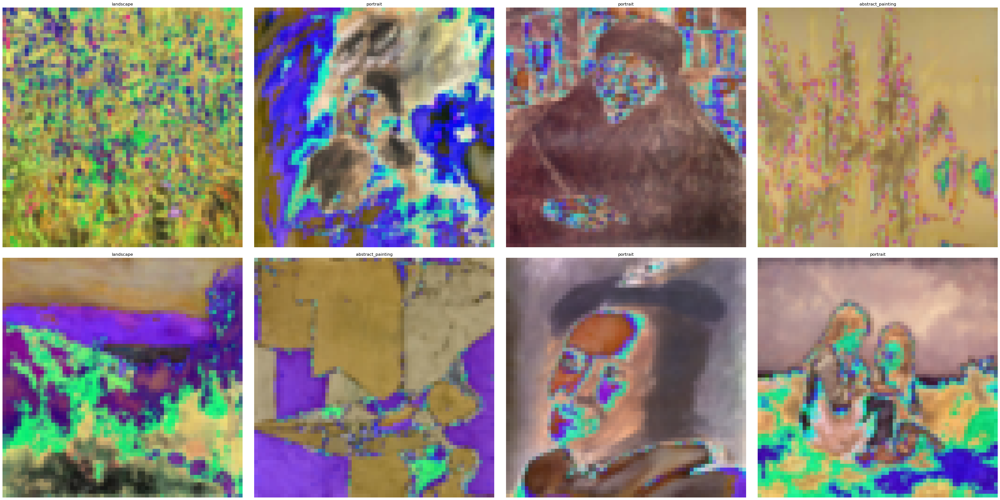

In [35]:
INPUT_DIM = 64
img_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((INPUT_DIM, INPUT_DIM)),
    transforms.CenterCrop((INPUT_DIM, INPUT_DIM)),
    # transforms.ToTensor(),
    # transforms.Normalize(0.5, 0.5),
])

plt.figure(figsize=(40, 40))
for i, sample in enumerate(genra_dataset):
    image = sample[0]
    label = sample[1]
    print(i, image.shape, label)

    ax = plt.subplot(4, 4, i + 1)
    plt.tight_layout()
    ax.set_title(label)
    ax.axis('off')
    # image = image.transpose((2, 0, 1))
    trs_img = img_transforms(image)
    plt.imshow(trs_img)

    if i == 7:
        plt.show()
        break

In [39]:
INPUT_DIM = 64
INPUT_CHN = 3
LATENT_DIM = 100
BATCH_SIZE = 64
# DATASIZE = 5000
GEN_FILTERS = 64
DIS_FILTERS = 64
CATEGORY_GENRE = 'genre'
LABEL_FILTERS = [0]
GEN_LR = 0.0001
DIS_LR = 0.0004


Category labels': 
0     abstract_painting
1             cityscape
2        genre_painting
3          illustration
4             landscape
5         nude_painting
6              portrait
7    religious_painting
8      sketch_and_study
9            still_life
Name: 1, dtype: object
Load images from : ./wikiart/genre_train.csv
WikiArt Label filters: ['abstract_painting']
Dataset size: 3478
0 2
torch.Size([64, 3, 64, 64])


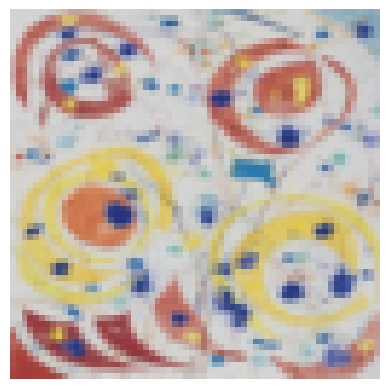

In [40]:

img_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((INPUT_DIM, INPUT_DIM)),
    transforms.CenterCrop((INPUT_DIM, INPUT_DIM)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])
genra_dataset = WikiArtDataset(root_dir='./wikiart/', category=CATEGORY_GENRE, transform=img_transforms, label_filters=LABEL_FILTERS)
dataloader = DataLoader(genra_dataset, batch_size=BATCH_SIZE,
                        shuffle=True, num_workers=0)

for i_batch, sample_batched in enumerate(dataloader):
    print(i_batch, len(sample_batched))

    # observe 4th batch and stop.
    if i_batch == 0:
        print(sample_batched[0].shape)
        plt.figure()

        img = sample_batched[0][2].permute(1, 2, 0)
        normalized_img = (img + 1) / 2
        plt.imshow(normalized_img)
        plt.axis('off')
        plt.ioff()
        plt.show()
        break

# Train GAN Model

In [41]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [42]:
device = 'cpu'
# Check if MPS is supported and available
if torch.backends.mps.is_available():
    print("MPS is available on this device.")
    device = torch.device("mps")  # Use MPS device
else:
    print("MPS not available, using CPU instead.")
    device = torch.device("cpu")  # Fallback to CPU



MPS is available on this device.


## Define Discriminator

In [61]:
class DCGANDiscriminatorNet64(nn.Module):
    '''128 * 128'''

    def __init__(self):
        super(DCGANDiscriminatorNet64, self).__init__()
        self.cons_layers = nn.Sequential(
            nn.Conv2d(INPUT_CHN, DIS_FILTERS, 4, 2, 1, bias=False),
            nn.BatchNorm2d(DIS_FILTERS),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: (ndf*2) x 32 x 32
            nn.Conv2d(DIS_FILTERS, DIS_FILTERS * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(DIS_FILTERS * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: (ndf*4) x 16 x 16
            nn.Conv2d(DIS_FILTERS * 2, DIS_FILTERS * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(DIS_FILTERS * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: (ndf*8) x 8 x 8
            nn.Conv2d(DIS_FILTERS * 4, DIS_FILTERS * 8, 8, 2, 1, bias=False),
            nn.BatchNorm2d(DIS_FILTERS * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: (ndf*16) x 4 x 4
            nn.Conv2d(DIS_FILTERS * 8, 1, 1, 1, 0, bias=False),
            nn.Flatten(),
            nn.Sigmoid(),
            # state size: 1 x 1 x 1
            # state size: 1
        )

    def forward(self, x):
        x = self.cons_layers(x)
        return x


class DCGANDiscriminatorNet(nn.Module):
    '''128 * 128'''

    def __init__(self):
        super(DCGANDiscriminatorNet, self).__init__()
        self.cons_layers = nn.Sequential(
            # input is (nc) x 128 x 128
            nn.Conv2d(INPUT_CHN, DIS_FILTERS, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: (ndf) x 64 x 64
            nn.Conv2d(DIS_FILTERS, DIS_FILTERS * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(DIS_FILTERS * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: (ndf*2) x 32 x 32
            nn.Conv2d(DIS_FILTERS * 2, DIS_FILTERS * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(DIS_FILTERS * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: (ndf*4) x 16 x 16
            nn.Conv2d(DIS_FILTERS * 4, DIS_FILTERS * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(DIS_FILTERS * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: (ndf*8) x 8 x 8
            nn.Conv2d(DIS_FILTERS * 8, DIS_FILTERS * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(DIS_FILTERS * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: (ndf*16) x 4 x 4
            nn.Conv2d(DIS_FILTERS * 16, 1, 1, 1, 0, bias=False),
            nn.Flatten(),
            nn.Sigmoid(),
            # state size: 1 x 1 x 1
            # state size: 1
        )

    def forward(self, x):
        x = self.cons_layers(x)
        return x

class SimpleDiscriminatorModel(nn.Module):

    def __init__(self):
        super(SimpleDiscriminatorModel, self).__init__()

        self.cons_layers = nn.Sequential(
            nn.Conv2d(INPUT_CHN, 64, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            # nn.Dropout(p=0.4),
            nn.Flatten(),
            nn.Linear(4096, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.cons_layers(x)
        return x



## Define Generator

In [50]:
class DCGANGeneratorNet64(nn.Module):
    '''128 * 128'''

    def __init__(self):
        super(DCGANGeneratorNet64, self).__init__()
        self.cons_layers = nn.Sequential(
            nn.Unflatten(1, (LATENT_DIM, 1, 1)),  # Corrected dimension ordering
            
            nn.ConvTranspose2d(LATENT_DIM, GEN_FILTERS * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(GEN_FILTERS * 8),
            nn.ReLU(True),
            # state size: (ngf*16) x 4 x 4
            nn.ConvTranspose2d(GEN_FILTERS * 8, GEN_FILTERS * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(GEN_FILTERS * 4),
            nn.ReLU(True),
            # state size: (ngf*8) x 8 x 8
            nn.ConvTranspose2d(GEN_FILTERS * 4, GEN_FILTERS * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(GEN_FILTERS * 2),
            nn.ReLU(True),
            # state size: (ngf*4) x 16 x 16
            nn.ConvTranspose2d(GEN_FILTERS * 2, GEN_FILTERS, 4, 2, 1, bias=False),
            nn.BatchNorm2d(GEN_FILTERS),
            nn.ReLU(True),
            # state size: (ngf*2) x 32 x 32
            nn.ConvTranspose2d(GEN_FILTERS, INPUT_CHN, 4, 2, 1, bias=False),
            # state size: (ngf) x 64 x 64
            nn.Tanh(),
        )

    def forward(self, x):
        x = self.cons_layers(x)
        return x

class DCGANGeneratorNet(nn.Module):
    '''128 * 128'''

    def __init__(self):
        super(DCGANGeneratorNet, self).__init__()
        self.cons_layers = nn.Sequential(
            nn.Unflatten(1, (LATENT_DIM, 1, 1)),  # Corrected dimension ordering
            
            nn.ConvTranspose2d(LATENT_DIM, GEN_FILTERS * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(GEN_FILTERS * 16),
            nn.ReLU(True),
            # state size: (ngf*16) x 4 x 4
            nn.ConvTranspose2d(GEN_FILTERS * 16, GEN_FILTERS * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(GEN_FILTERS * 8),
            nn.ReLU(True),
            # state size: (ngf*8) x 8 x 8
            nn.ConvTranspose2d(GEN_FILTERS * 8, GEN_FILTERS * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(GEN_FILTERS * 4),
            nn.ReLU(True),
            # state size: (ngf*4) x 16 x 16
            nn.ConvTranspose2d(GEN_FILTERS * 4, GEN_FILTERS * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(GEN_FILTERS * 2),
            nn.ReLU(True),
            # state size: (ngf*2) x 32 x 32
            nn.ConvTranspose2d(GEN_FILTERS * 2, GEN_FILTERS, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(INPUT_CHN),
            nn.BatchNorm2d(GEN_FILTERS),
            nn.ReLU(True),
            # state size: (ngf) x 64 x 64
            nn.ConvTranspose2d(GEN_FILTERS, INPUT_CHN, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size: (nc) x 128 x 128
        )

    def forward(self, x):
        x = self.cons_layers(x)
        return x

class SimpleGeneratorModel(nn.Module):

    def __init__(self):
        super(SimpleGeneratorModel, self).__init__()
        self.cons_layers = nn.Sequential(
            nn.Linear(LATENT_DIM, 128 * 8 * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Unflatten(1, (128, 8, 8)),  # Corrected dimension ordering

            # upsample to 16 * 16
            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(inplace=True),

            # upsample to 32 * 32
            nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(inplace=True),

            nn.Conv2d(128, 3, kernel_size=1, padding=0),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.cons_layers(x)
        return x

In [56]:
class GAN(nn.Module):

    def __init__(self, generator, discriminator):
        super(GAN, self).__init__()

        self.gan = nn.Sequential(
            generator,
            discriminator
        )


    def forward(self, x):
        return self.gan(x)


In [57]:
def generate_latent_point(n_samples, latent_dim):
    x = torch.randn(n_samples, latent_dim)
    return x

def generate_false_samples(g_model, device, batch_size=500, latent_dim=100):
    X = generate_latent_point(batch_size, latent_dim)
    # X = X.view(batch_size, latent_dim, 1, 1)
    # print(f'Latent Points: {X.shape}')
    X = X.to(device)
    X = g_model(X)
    y = torch.zeros((batch_size, 1))
    X = X.to(device)
    y = y.to(device)
    # print(f'False sample: {X.shape}, y: {y.shape}')
    return X, y

In [51]:
g_model = DCGANGeneratorNet64()
g_model.to(device)

gen_ret = generate_false_samples(g_model, device, BATCH_SIZE, LATENT_DIM)[0]
gen_ret.shape

torch.Size([64, 3, 64, 64])

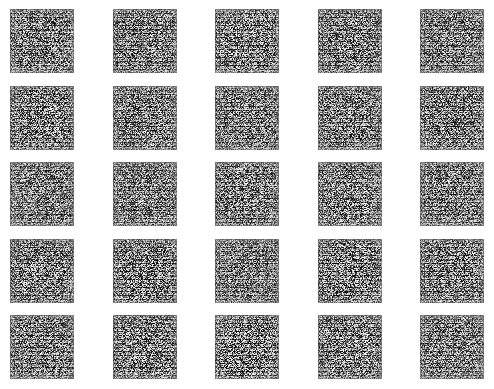

In [52]:
for i in range(25):
 # define subplot
 plt.subplot(5, 5, 1 + i)
 # turn off axis
 plt.axis('off')
 # plot raw pixel data
 plt.imshow(gen_ret[i, 0, :, :].detach().cpu().numpy(), cmap='gray_r')
plt.show()

## Training

In [55]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

def save_plot(samples, epoch, n=5):
    # plot images
    for i in range(n * n):
        # define subplot
        plt.subplot(n, n, 1 + i)
        # turn off axis
        plt.axis('off')
        # plot raw pixel data
        # print(samples[i])
        # print(f'samples shape: {samples[i, :, :, :].shape}')
        img = samples[i, :, :, :].detach().cpu().permute(1, 2, 0).numpy()
        normalized_img = (img + 1) / 2
        # print(img.shape)
        plt.imshow(normalized_img)
    # save plot to file
    filename = './generated_plot_e%03d.png' % (epoch + 1)
    plt.savefig(filename)
    plt.close()

def summarize_performance(epoch, g_model, d_model, test_loader, device, batch_size, latent_dim=100):
    X_false, y_false = generate_false_samples(g_model, device, batch_size, latent_dim)
    X_false = X_false.to(device)
    y_false = y_false.to(device)

    # Test model
    # test_model(X_false, batch_size, d_model, device, epoch, test_loader, y_false)

    # Plot images
    save_plot(X_false, epoch)


def test_model(X_false, batch_size, d_model, device, epoch, test_loader, y_false):
    avg_true_acc = 0.
    with torch.no_grad():
        for b, data in enumerate(test_loader):
            test_inputs, _ = data
            test_inputs = test_inputs.to(device)
            # test_labels = test_labels.to(device)

            test_labels = torch.ones((batch_size, 1), dtype=torch.float).to(device)

            test_outputs = d_model(test_inputs)

            # Accuracy
            predicted = test_outputs > 0.5  # Threshold logits at 0 for classification
            correct = (predicted == test_labels).float().sum()

            acc = correct / test_outputs.size(0)

            avg_true_acc += acc.cpu()
        avg_true_acc = avg_true_acc / len(test_loader)
    false_outputs = d_model(X_false)
    false_predictd = (false_outputs > 0.5).to(device)
    false_correct = (false_predictd == y_false).float().sum()
    false_acc = false_correct / len(X_false)
    print(f'\tEpoch[{epoch}] True acc: {avg_true_acc:.4f}, False acc: {false_acc:.4f}')


def discriminator_loss(output_true, output_fake):
    true_loss = F.binary_cross_entropy(output_true, torch.ones_like(output_true))
    fake_loss = F.binary_cross_entropy(output_fake, torch.zeros_like(output_fake))
    total_loss = true_loss + fake_loss
    return total_loss

def generator_loss(output_fake):
    generated_loss = F.binary_cross_entropy(output_fake, torch.ones_like(output_fake))
    return generated_loss



def train_gan(g_model, d_model, gan_model, train_loader, device, epochs=100, batch_size=500, latent_dim=100):
    optimizer_g = torch.optim.Adam(g_model.parameters(), lr=0.0002, betas=(0.5, 0.999))
    optimizer_d = torch.optim.Adam(d_model.parameters(), lr=0.0002, betas=(0.5, 0.999))
    print(device)
    for epoch in range(epochs):
        for b, batch_dataset in enumerate(train_loader):
            X_true, _ = batch_dataset
            X_true = X_true.to(device)

            y_true = torch.ones((batch_size, 1), dtype=torch.float)
            y_true = y_true.to(device)

            # Phase 1: Discriminating: Focusing on updating discriminator
            ## Generate false samples with a trained generator

            X_false, y_false = generate_false_samples(g_model, device, batch_size, latent_dim)

            # print(f'\tY shape, true: {y_true.shape}, false: {y_false.shape}')
            optimizer_d.zero_grad()
            d_true = d_model(X_true)
            # print(f'D model output shape: {d_true.shape}')

            true_loss = F.binary_cross_entropy(d_true, torch.ones_like(d_true))
            true_loss.backward()
            d_x = d_true.mean().item() # Loss of D(x)

            d_fake = d_model(X_false.detach())
            fake_loss = F.binary_cross_entropy(d_fake, torch.zeros_like(d_fake))
            fake_loss.backward()
            d_g_z1 = d_fake.mean().item()

            d_loss = true_loss + fake_loss
            optimizer_d.step()

            # Phase 2: Polishing fake examples: Focusing on updating generator
            # X_false, y_false = generate_false_samples_v2(g_model, device, batch_size * 2, latent_dim)
            optimizer_g.zero_grad()
            g_fake = d_model(X_false)
            g_loss = F.binary_cross_entropy(g_fake, torch.ones_like(g_fake))
            g_loss.backward()
            d_g_z2 = g_fake.mean().item()
            optimizer_g.step()

            print(f'Epoch[{epoch}], Batch[{b}] Loss G: {g_loss:.4f}, Loss D: {d_loss:.4f}, D(x): {d_x:.4f}, D(G(z1)): {d_g_z1:.4f}, D(G(z2)): {d_g_z2:.4f}')

        if (epoch + 1) % 2 == 0:
            # Plot performance every 5 epoch
            summarize_performance(epoch, g_model, d_model, None, device, batch_size, latent_dim)



In [62]:
d_model = DCGANDiscriminatorNet64()
d_model.to(device)
d_model.apply(weights_init)

g_model = DCGANGeneratorNet64()
g_model.to(device)
g_model.apply(weights_init)

gan_model = GAN(g_model, d_model)
gan_model.to(device)

# summarize_performance(10, g_model, d_model, None, device, BATCH_SIZE, LATENT_DIM)
train_gan(g_model, d_model, gan_model, dataloader, device, epochs=10, batch_size=BATCH_SIZE, latent_dim=LATENT_DIM)

mps
Epoch[0], Batch[0] Loss G: 0.7724, Loss D: 1.4096, D(x): 0.4852, D(G(z1)): 0.4857, D(G(z2)): 0.4674
Epoch[0], Batch[1] Loss G: 0.7500, Loss D: 1.4050, D(x): 0.4925, D(G(z1)): 0.4884, D(G(z2)): 0.4761
Epoch[0], Batch[2] Loss G: 0.7379, Loss D: 1.4135, D(x): 0.4963, D(G(z1)): 0.4908, D(G(z2)): 0.4805
Epoch[0], Batch[3] Loss G: 0.7359, Loss D: 1.4244, D(x): 0.4977, D(G(z1)): 0.4928, D(G(z2)): 0.4824
Epoch[0], Batch[4] Loss G: 0.7395, Loss D: 1.3809, D(x): 0.5066, D(G(z1)): 0.4925, D(G(z2)): 0.4803
Epoch[0], Batch[5] Loss G: 0.7404, Loss D: 1.3710, D(x): 0.5090, D(G(z1)): 0.4930, D(G(z2)): 0.4793
Epoch[0], Batch[6] Loss G: 0.7446, Loss D: 1.3678, D(x): 0.5094, D(G(z1)): 0.4914, D(G(z2)): 0.4772
Epoch[0], Batch[7] Loss G: 0.7513, Loss D: 1.3602, D(x): 0.5071, D(G(z1)): 0.4877, D(G(z2)): 0.4737
Epoch[0], Batch[8] Loss G: 0.7537, Loss D: 1.3374, D(x): 0.5179, D(G(z1)): 0.4875, D(G(z2)): 0.4723
Epoch[0], Batch[9] Loss G: 0.7614, Loss D: 1.3492, D(x): 0.5075, D(G(z1)): 0.4833, D(G(z2)): 0.4

In [42]:
summarize_performance(10, g_model, d_model, None, device, BATCH_SIZE, LATENT_DIM)